In [1]:
from diffusers.models import AutoencoderKL
import torch
import torchvision.transforms as transforms
from torchvision.transforms.functional import to_tensor, to_pil_image
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os

pretrained_model_path = "./data/diffusion_weights/stable-diffusion-v1-5"
vae = AutoencoderKL.from_pretrained(pretrained_model_path, subfolder="vae").to("cuda" if torch.cuda.is_available() else "cpu")

/opt/conda/envs/fb/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import torch
from torchvision.transforms.functional import to_pil_image
from einops import rearrange

def load_and_decode_latent(file_path, vae):
    # Load the latent tensor directly
    latent_tensor = torch.load(file_path)

    # Add batch dimension if it's not present
    if latent_tensor.dim() == 3:
        latent_tensor = latent_tensor.unsqueeze(0)

    # Scale the latents to match VAE's expected distribution
    latent_tensor = 1 / 0.18215 * latent_tensor

    # Ensure the latent tensor is on the same device as the VAE model
    latent_tensor = latent_tensor.to(vae.device)

    # Decode the latent tensor using the VAE
    with torch.no_grad():
        # If you're decoding a single frame, no need to rearrange as in a video
        decoded = vae.decode(latent_tensor).sample

    # Normalize the decoded frames to [0, 1]
    decoded = (decoded / 2 + 0.5).clamp(0, 1)

    # Convert to PIL image for display
    decoded_image = to_pil_image(decoded.squeeze(0))
    
    os.makedirs("final_latents", exist_ok=True)
    destination_path = os.path.join("final_latents", os.path.basename(file_path).split(".")[0]+".png")
    decoded_image.save(destination_path)

    return decoded_image

# Usage example

# latent_file_path = 'temp/final/50_0_5.pt'  # Update this to the actual file path
# decoded_image = load_and_decode_latent(latent_file_path, vae)

# # Display the image
# plt.imshow(decoded_image)
# plt.axis('off')
# plt.show()


In [3]:
# output_image_path = 'output_image.png'
# decoded_image.save(output_image_path)

In [4]:
os.listdir()
# Specify the directory you want to list
folder_path = 'temp/final'

# Get a list of files and directories in the specified directory
entries = os.listdir(folder_path)

# Filter out directories, only keep files
files = [entry for entry in entries if os.path.isfile(os.path.join(folder_path, entry))]
files = [os.path.join('temp/final', file) for file in files]

In [5]:
# files

In [6]:
for file in files:
    # print(file)
    load_and_decode_latent(file, vae)
    

In [7]:
# os.path.basename(latent_file_path)

In [8]:
image_names = os.listdir("final_latents")

In [15]:
len(image_names)

180

In [9]:
# parsed_names = []
# for name in image_names:
#     parts = name.split('_')
#     if len(parts) == 3 and parts[2].split('.')[0].isdigit():
#         step = int(parts[0])  # Inference step
#         image_number = int(parts[2].split('.')[0])  # Image number
#         parsed_names.append((step, image_number, name))

In [10]:
# parsed_names

In [11]:
# # Filter out any non-PNG files or unwanted entries
# image_files = [f for f in image_names if f.endswith('.png')]

# # Parse the file names and sort them
# parsed_files = sorted(
#     ((int(f.split('_')[0]), int(f.split('_')[2].split('.')[0]), f) for f in image_files),
#     key=lambda x: (x[0], x[1])
# )

# # Create the grid plot
# num_steps = 50  # Inference steps
# num_images_per_step = 6  # Images per step

# fig, axs = plt.subplots(num_steps, num_images_per_step, figsize=(15, 125))

# # Set titles for each column
# for j in range(num_images_per_step):
#     axs[0, j].set_title(f'Title {j + 1}', fontsize=16, weight='bold')

# for i in range(num_steps):
#     for j in range(num_images_per_step):
#         index = i * num_images_per_step + j
#         if index < len(parsed_files):
#             step, img_num, file_name = parsed_files[index]
#             img_path = os.path.join('final_latents', file_name)  # Assuming images are in the current directory
#             img = Image.open(img_path)
#             axs[i, j].imshow(img)
#             axs[i, j].set_title(f'Step {step}, Image {img_num}', fontsize=8)
#             axs[i, j].axis('off')
#         else:
#             axs[i, j].axis('off')

# plt.tight_layout()
# plt.savefig('diffusion_generation.png')
# plt.show()

In [12]:
# import matplotlib.pyplot as plt
# import os
# from PIL import Image

# # Assuming image_names contains your image file names
# image_files = [f for f in image_names if f.endswith('.png')]

# # Parse the file names and sort them
# parsed_files = sorted(
#     ((int(f.split('_')[0]), int(f.split('_')[2].split('.')[0]), f) for f in image_files),
#     key=lambda x: (x[0], x[1])
# )

# # Create the grid plot
# num_steps = 50  # Inference steps
# num_images_per_step = 6  # Images per step

# fig, axs = plt.subplots(num_steps, num_images_per_step, figsize=(15, 125))

# # Set titles for each column
# for j in range(num_images_per_step):
#     axs[0, j].set_title(f'Title {j + 1}', fontsize=16, weight='bold')

# for i in range(num_steps):
#     for j in range(num_images_per_step):
#         index = i * num_images_per_step + j
#         if index < len(parsed_files):
#             step, img_num, file_name = parsed_files[index]
#             img_path = os.path.join('final_latents', file_name)
#             img = Image.open(img_path)
#             axs[i, j].imshow(img)
#             axs[i, j].axis('off')
#         else:
#             axs[i, j].axis('off')

# # Adjust the layout
# plt.tight_layout(pad=3.0)
# plt.subplots_adjust(top=0.96)  # You might need to adjust this value based on your figure size

# plt.savefig('diffusion_generation.png')
# plt.show()


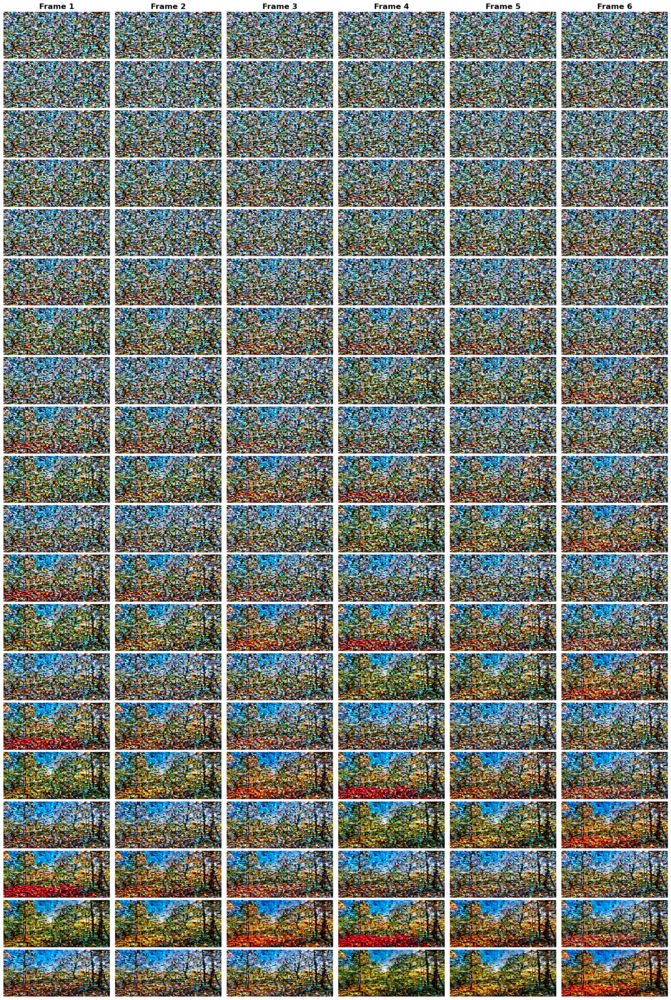

In [13]:
import matplotlib.pyplot as plt
import os
from PIL import Image
import textwrap

# Assuming image_names contains your image file names
image_files = [f for f in image_names if f.endswith('.png')]

# Parse the file names and sort them
parsed_files = sorted(
    ((int(f.split('_')[0]), int(f.split('_')[2].split('.')[0]), f) for f in image_files),
    key=lambda x: (x[0], x[1])
)

# # Titles for each column
# titles = ["Title 1", "Title 2", "Title 3", "Title 4", "Title 5", "Title 6"]
# titles = ["The sky, partially cloudy, with faint hints of colors starting to emerge.",
#                   "A faint arch of colors becomes visible, stretching across the sky.",
#                   "The rainbow gains intensity as the colors become more vibrant and defined.",
#                   "The rainbow is now fully formed, displaying its classic arc shape.",
#                   "The colors of the rainbow shine brilliantly against the backdrop of the sky.",
#                   "The rainbow remains steady, its colors vivid and captivating as the rainbow decorates the sky."]
# titles = [textwrap.fill(title, width=40) for title in titles]

# Create the grid plot







# code below


num_steps = 20  # Inference steps
num_images_per_step = 6  # Images per step
titles = [f"Frame {i + 1}" for i in range(num_images_per_step)]

# Increase the overall size of the figure
fig, axs = plt.subplots(num_steps, num_images_per_step, figsize=(20, 30))

# Set titles for each column from the titles list
for j in range(num_images_per_step):
    axs[0, j].set_title(titles[j], fontsize=16, weight='bold')

for i in range(num_steps):
    for j in range(num_images_per_step):
        index = i * num_images_per_step + j
        if index < len(parsed_files):
            step, img_num, file_name = parsed_files[index]
            img_path = os.path.join('final_latents', file_name)
            img = Image.open(img_path)
            axs[i, j].imshow(img, aspect='auto')  # Adjust aspect ratio to 'auto' or remove it for natural image ratio
            axs[i, j].axis('off')
        else:
            axs[i, j].axis('off')

    # Set y-axis label with inference step number
    axs[i, 0].set_ylabel(f"Step {i+1}", rotation=0, labelpad=40, va='center', fontsize=12)

# Adjust the layout
plt.tight_layout(pad=3.0)
plt.subplots_adjust(top=0.96, wspace=0.05, hspace=0.05)  # Reduced spacing between images to give more space to images

plt.savefig('diffusion_generation_summer_to_autumn.png')
plt.show()
